  <h1 style="position: relative; top: ; transform: translateY;"> Object Detection Using Adaptive Mask RCNN in Optical Remote Sensing Images</h1>


The VHR-10 dataset is a collection of Very High Resolution remote sensing images of 10 classes, provided by Northwestern Polytechnical University (NWPU) in China.

Comprising a total of 800 VHR optical remote sensing images, 715 of these are color images acquired from Google Earth with spatial resolutions between 0.5 to 2 meters. The remaining 85 are color-infrared (CIR) images pan-sharpened, obtained from the Vaihingen dataset with a spatial resolution of 0.08 meters.

The dataset is divided into two sets:

Positive image set (650 images): Images containing at least one object of interest.
Negative image set (150 images): Images with no objects of interest.
The positive image set includes objects from the following ten classes:

Airplanes (757)
Ships (302)
Storage tanks (655)
Baseball diamonds (390)
Tennis courts (524)
Basketball courts (159)
Ground track fields (163)
Harbors (224)
Bridges (124)
Vehicles (477)
It includes object detection bounding boxes and instance segmentation masks.

#  Import the necessary libraries

In [2]:
# Install detectron 2
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-vya3xm_2
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-vya3xm_2
  Resolved https://github.com/facebookresearch/detectron2.git to commit 5c380fdfc62b0124204155d6be3b1016e3dadb2d
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 862.0 kB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 1.6 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 8.7 MB/s eta 0:00:00ta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
# Importing Essential libraries
import os
import matplotlib.pyplot as plt
#Importing CocoTools to load, manipulate, convert and visualize COCO format datasets
from pycocotools.coco import COCO
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer, HookBase
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import ColorMode
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.logger import setup_logger
from detectron2.data.datasets import register_coco_instances
from detectron2.data import transforms as T
import random
import skimage.io as io
# Set base params
plt.rcParams["figure.figsize"] = [16,9]

# Importing dataset using COCOTools

In [4]:
#Pointing cocotools to the location of the Json that describes the train dataset
#All dataset Json
coco = COCO('/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train/train.json')
#annotation decrit image bl segmentation mas w bbox 

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!


In [5]:
#Load categorries described in Json Files
cats=coco.loadCats(coco.getCatIds())
cats

[{'supercategory': 'airplane', 'id': 1, 'name': 'airplane'},
 {'supercategory': 'ship', 'id': 2, 'name': 'ship'},
 {'supercategory': 'storage tank', 'id': 3, 'name': 'storage tank'},
 {'supercategory': 'baseball diamond', 'id': 4, 'name': 'baseball diamond'},
 {'supercategory': 'tennis court', 'id': 5, 'name': 'tennis court'},
 {'supercategory': 'basketball court', 'id': 6, 'name': 'basketball court'},
 {'supercategory': 'ground track field',
  'id': 7,
  'name': 'ground track field'},
 {'supercategory': 'harbor', 'id': 8, 'name': 'harbor'},
 {'supercategory': 'bridge', 'id': 9, 'name': 'bridge'},
 {'supercategory': 'vehicle', 'id': 10, 'name': 'vehicle'}]

In [6]:
#Extracting names from categories
names=[cat['name'] for cat in cats]
names

['airplane',
 'ship',
 'storage tank',
 'baseball diamond',
 'tennis court',
 'basketball court',
 'ground track field',
 'harbor',
 'bridge',
 'vehicle']

In [7]:
catIds=coco.getCatIds(catNms=['tennis_court','basketball_court'])
# This gets the images where both or all of these categories are present in the image
imgIds = coco.getImgIds(catIds=catIds)

In [8]:
print(imgIds)
#These are the images ids with both 'tennis_court','basketball_court' objects present (instances)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

In [9]:
random_img_id=random.choice(imgIds) # Takes a random id
# Load the image
imgId = coco.getImgIds(imgIds = [random_img_id])
img = coco.loadImgs(imgId)[0]
print("Image details \n",img)

Image details 
 {'id': 93, 'file_name': '426.jpg', 'width': 1014, 'height': 688}


In [10]:
#get annotations (description of images' segmentation masks and bounding boxes of each object instance per images)
annIds = coco.getAnnIds(imgIds=imgId,iscrowd=None)
anns = coco.loadAnns(annIds)

In [11]:
# Create a dictionary between category_id and category name
category_map = dict()

for ele in list(coco.cats.values()):
    category_map.update({ele['id']:ele['name']})
category_map

{1: 'airplane',
 2: 'ship',
 3: 'storage tank',
 4: 'baseball diamond',
 5: 'tennis court',
 6: 'basketball court',
 7: 'ground track field',
 8: 'harbor',
 9: 'bridge',
 10: 'vehicle'}

In [8]:
train_img_dir = '/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train'
test_img_dir = '/kaggle/input/nwpu-vhr-10/NWPU VHR-10/test'

Objects are: ['vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle', 'vehicle']


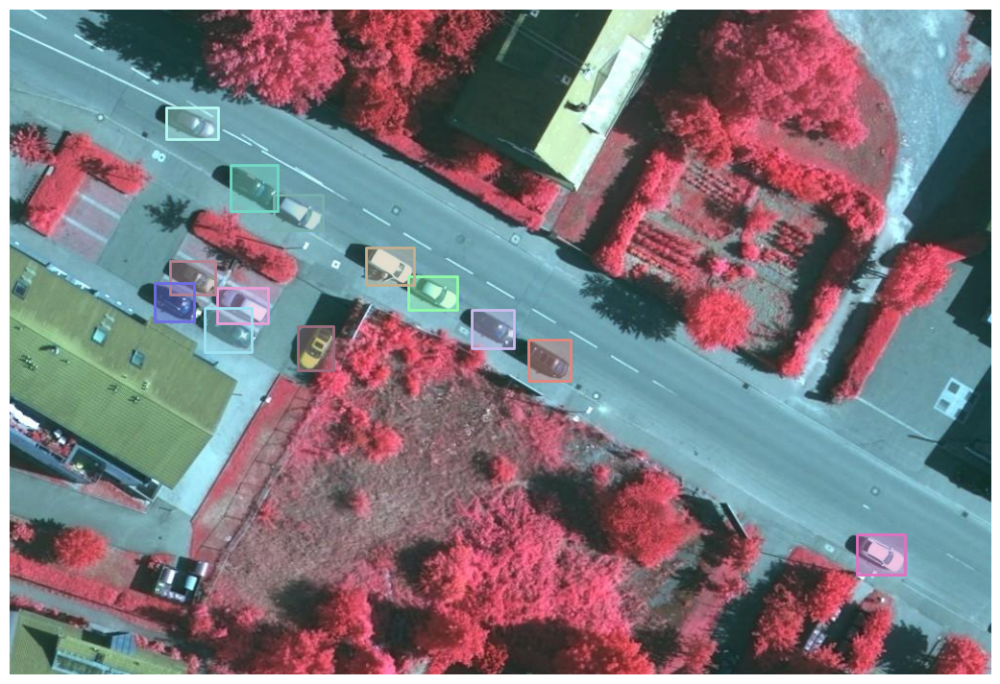

In [13]:
#Create a list of objects in the image
parts = []
for region in anns:
    parts.append(category_map[region['category_id']])

print("Objects are:", parts)

#Plot Parts masks
I = io.imread(train_img_dir + '/' + img['file_name'])
plt.imshow(I)
plt.axis('off')
coco.showAnns(anns)

we are  analyzing an image, extracting objects based on their category and then visualizing these with their bounding boxes.

# Modeling Work with Detectron2

Detectron2 is a popular open-source research platform that provides a wide variety of pre-trained models for image detection tasks allowing researchers and developers to plug in their own modules and make modifications to suit their needs.is powered by PyTorch deep learning framework. provides a large set of pre-trained models that are ready to use for various tasks, 

In [9]:
# To find out inconsistent CUDA versions, if there is not "failed" word in this output then things are fine.
!python -m detectron2.utils.collect_env

-------------------------------  ------------------------------------------------------------------------------
sys.platform                     linux
Python                           3.10.13 | packaged by conda-forge | (main, Dec 23 2023, 15:36:39) [GCC 12.3.0]
numpy                            1.26.4
detectron2                       0.6 @/opt/conda/lib/python3.10/site-packages/detectron2
Compiler                         GCC 9.4
CUDA compiler                    CUDA 12.1
detectron2 arch flags            7.5
DETECTRON2_ENV_MODULE            <not set>
PyTorch                          2.1.2 @/opt/conda/lib/python3.10/site-packages/torch
PyTorch debug build              False
torch._C._GLIBCXX_USE_CXX11_ABI  True
GPU available                    Yes
GPU 0,1                          Tesla T4 (arch=7.5)
Driver version                   535.129.03
CUDA_HOME                        /usr/local/cuda
Pillow                           9.5.0
torchvision                      0.16.2 @/opt/conda/lib/pyt

In [10]:
dataset_dir = "/kaggle/input/nwpu-vhr-10/NWPU VHR-10"

In [11]:
register_coco_instances("train", {}, os.path.join(dataset_dir,"train", "train.json"), train_img_dir)
register_coco_instances("test", {}, os.path.join(dataset_dir,"test", "test.json"), test_img_dir)

In [12]:
dataset_dicts = DatasetCatalog.get("train")
metadata_dicts = MetadataCatalog.get("train")

we are setting up a dataset for segmentation model using the COCO format in Detectron2 . we aims to register training and testing datasets and then retrieve and print the dictionary of dataset metadata.

In [20]:
print(dataset_dicts)

[{'file_name': '/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train/413.jpg', 'height': 677, 'width': 938, 'image_id': 0, 'annotations': [{'iscrowd': 0, 'bbox': [595, 270, 55, 62], 'category_id': 9, 'segmentation': [[595, 270, 595, 332, 650, 332, 650, 270]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [747, 232, 47, 55], 'category_id': 9, 'segmentation': [[747, 232, 747, 287, 794, 287, 794, 232]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [700, 360, 69, 50], 'category_id': 9, 'segmentation': [[700, 360, 700, 410, 769, 410, 769, 360]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [786, 336, 64, 56], 'category_id': 9, 'segmentation': [[786, 336, 786, 392, 850, 392, 850, 336]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [860, 316, 57, 48], 'category_id': 9, 'segmentation': [[860, 316, 860, 364, 917, 364, 917, 316]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train/211.jpg', 'height':

In [21]:
metadata_dicts

namespace(name='train',
          json_file='/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train/train.json',
          image_root='/kaggle/input/nwpu-vhr-10/NWPU VHR-10/train',
          evaluator_type='coco',
          thing_classes=['airplane',
                         'ship',
                         'storage tank',
                         'baseball diamond',
                         'tennis court',
                         'basketball court',
                         'ground track field',
                         'harbor',
                         'bridge',
                         'vehicle'],
          thing_dataset_id_to_contiguous_id={1: 0,
                                             2: 1,
                                             3: 2,
                                             4: 3,
                                             5: 4,
                                             6: 5,
                                             7: 6,
                                            

This metadata provides crucial information about the dataset, its structure, and how to interpret the data it contains.

## Data Augmentation

In [13]:
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
import copy
import torch
# override  custom rapper because it is a fct deault in detectron 
def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    transform_list = [
        T.Resize((1024,1024)),
        T.RandomBrightness(0.9, 1.2),
        T.RandomContrast(0.9, 1.2),
        T.RandomSaturation(0.9, 1.2),
#         T.RandomRotation(angle=[90, 90]),
        T.RandomLighting(0.7),
        T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
        T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
    ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict

A list of transformations is defined to augment the image. These transformations include:
Resize: Changes the image dimensions to 1024x1024.

RandomBrightness, RandomContrast, RandomSaturation: Adjusts the brightness, contrast, and saturation of the image within specified ranges to simulate different lighting conditions.
RandomLighting: Applies a random lighting noise.

RandomFlip: Horizontally and vertically flips the image with a 50% probability for each.
(Commented out transformation)

RandomRotation: This is commented out but would rotate the image by 90 degrees.

## Creating model

## ADAM Optimizer

### Fine-Tuning and Configuration

In [21]:
cfg = get_cfg()

# Load model with weights
base_model = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(model_zoo.get_config_file(base_model))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(base_model)

# Define Datasets
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("test",)

cfg.DATALOADER.NUM_WORKERS = 2 # nbr of workers per batch split the workload on the neural networks
cfg.SOLVER.IMS_PER_BATCH = 2 #  two images will be processed at a time during the training of your model.

cfg.SOLVER.BASE_LR = 0.001 # The learning rate is a hyper-parameter that determines the step size at each 
#iteration while moving toward a minimum of a loss function
cfg.SOLVER.GAMMA = 0.05 # multiplicative factor of lr decay multilied by lr bich maytihich fissa3 
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # parameter of the ROI_HEADS means that you’re specifying the 
#batch size per image to be 128.

cfg.SOLVER.WARMUP_ITERS = 50 #help to increase lr to have our goals
cfg.SOLVER.MAX_ITER = 500 #epochs
cfg.TEST.EVAL_PERIOD = 100#This means that the model will be evaluated every 100 iterations during training

# Set number of classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10
cfg.MODEL.RETINANET.NUM_CLASSES = 10
# Set optimizer to Adam
cfg.SOLVER.OPTIMIZER = "ADAM"
# Optionally set Adam specific parameters like betas and eps if you want different values than the defaults:
# cfg.SOLVER.ADAM_BETAS = (0.9, 0.999)
# cfg.SOLVER.ADAM_EPS = 1e-8
cfg.OUTPUT_DIR = 'train_output_augmented'

adam is good because its  adaptive learning rate mechanism,

## Training the model with the augmented data

In [22]:
from detectron2.data import build_detection_test_loader, build_detection_train_loader
class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("/kaggle/working/coco_eval_augmented", exist_ok=True)
            output_folder = "/kaggle/working/coco_eval_augmented"
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
    #CocoEvaluator extracts CocoMetrics based on the predictions of the model
    
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

In [23]:
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

model_final_f10217.pkl: 178MB [00:01, 149MB/s]                             
/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
2024-05-05 17:46:11.884265: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-05 17:46:11.884387: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-05 17:46:12.037373: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin c

Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.193
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.449
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.110
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.007
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.177
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.189
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.112
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.276
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.317
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.054
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.293
 Average Recall     (AR) @[ IoU=0.50:0.

interception between mask and bbox

## Inference and evaluation of trained model 

In [24]:
# After training, evaluate on the test dataset
evaluator = CustomTrainer.build_evaluator(cfg, "test", "./output_augmented/")
test_loader = build_detection_test_loader(cfg, "test")
metrics = inference_on_dataset(trainer.model, test_loader, evaluator)
print(metrics)

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.481
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.859
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.510
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.051
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.445
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.477
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.194
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.498
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.584
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.256
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.526
 Average Recall     (AR) @[ IoU=0.50:0.

**Recall**

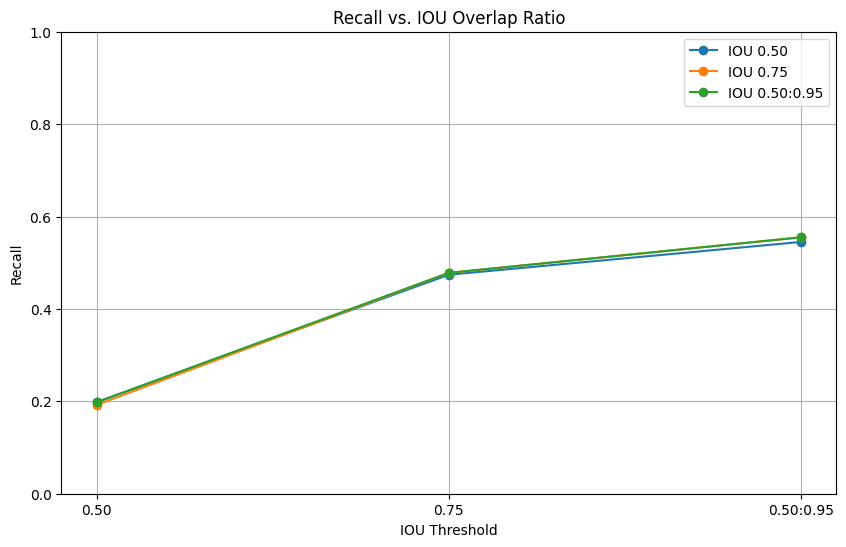

In [25]:
import matplotlib.pyplot as plt

# Recall values for different IOU thresholds
iou_thresholds = ['0.50', '0.75', '0.50:0.95']
recall_values = {
    '0.50': [0.198, 0.474, 0.545],
    '0.75': [0.192, 0.478, 0.555],
    '0.50:0.95': [0.198, 0.478, 0.555]
}

# Setting up the line plot
iou_values = range(len(iou_thresholds))  # the label locations

plt.figure(figsize=(10, 6))

# Plotting Recall for each IOU threshold
for iou_thr in iou_thresholds:
    plt.plot(iou_values, recall_values[iou_thr], marker='o', label=f'IOU {iou_thr}')

plt.xlabel('IOU Threshold')
plt.ylabel('Recall')
plt.title('Recall vs. IOU Overlap Ratio')
plt.xticks(iou_values, iou_thresholds)
plt.legend()
plt.grid(True)
plt.ylim(0, 1)
plt.show()


IoU = 0.50 (Blue Line):
The recall starts high (approximately 0.98) at an IoU threshold of 0.50. This indicates that the model is quite effective at detecting objects when a 50% overlap with the ground truth is considered sufficient.

IoU = 0.75 (Green Line):
The recall is slightly lower at an IoU threshold of 0.75 compared to 0.50, starting around 0.92. This drop reflects the increased difficulty of achieving a 75% overlap. A higher IoU threshold generally requires the model to be more precise with its bounding boxes, which can be challenging, hence the lower recall.

IoU = 0.50 to 0.95 (Orange Line):
The recall is significantly lower when considering the average recall across a range of IoU thresholds from 0.50 to 0.95, starting at approximately 0.198. This much lower recall at a broad range of stringent IoU values indicates that while the model performs well at lower IoU thresholds (like 0.50), its performance drops notably as the required overlap increases. This average could be heavily influenced by very low recall at very high IoU thresholds (close to 0.95).

**Precision ADAM**

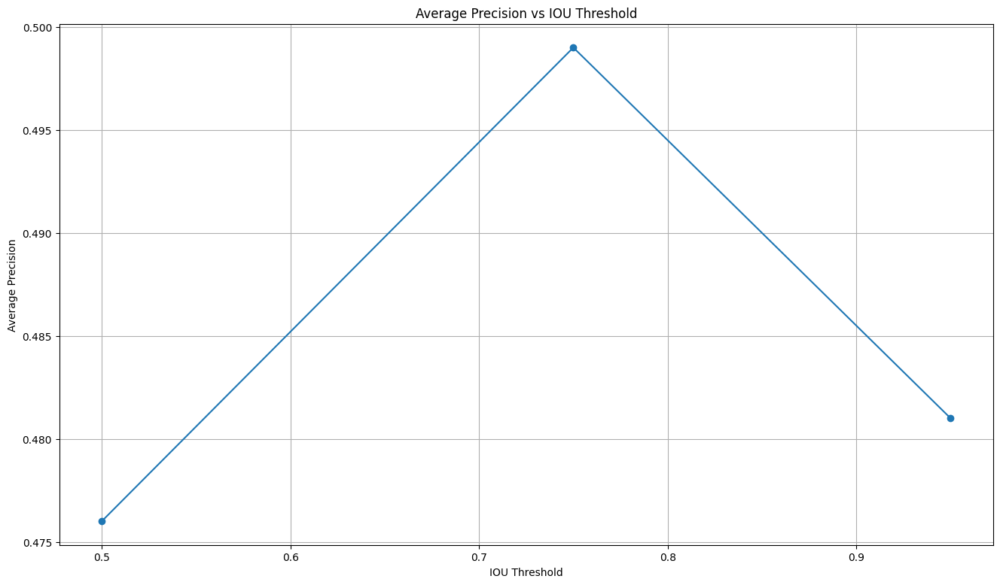

In [42]:
iou_thresholds = [0.50, 0.75, 0.95]
average_precision = [0.476, 0.499, 0.481]  # AP values corresponding to IOU thresholds

# Plotting
plt.plot(iou_thresholds, average_precision, marker='o')
plt.title("Average Precision vs IOU Threshold")
plt.xlabel("IOU Threshold")
plt.ylabel("Average Precision")
plt.grid(True)
plt.show()

IoU Threshold at 0.50:
AP: 0.476 - At an IoU threshold of 0.50, the model achieves an average precision of approximately 0.476. This value is relatively modest, indicating that the model can correctly identify and localize objects with at least 50% overlap with the ground truth about 47.6% of the time.

IoU Threshold at 0.75:
AP: 0.499 - The average precision increases to approximately 0.499 at an IoU threshold of 0.75. This improvement suggests that the model is relatively competent at a higher precision level, correctly identifying and localizing objects with at least 75% overlap nearly 50% of the time. This is somewhat unusual as typically, AP decreases with higher IoU thresholds due to the increased difficulty of achieving more precise overlaps.

IoU Threshold at 0.95:
AP: 0.481 - At the very strict IoU threshold of 0.95, the average precision decreases to 0.481. This value is surprisingly high given the extremely high precision required, indicating that the model retains much of its precision even under stringent conditions. Typically, AP at such a high IoU would be much lower due to the difficulty in achieving near-perfect overlap.

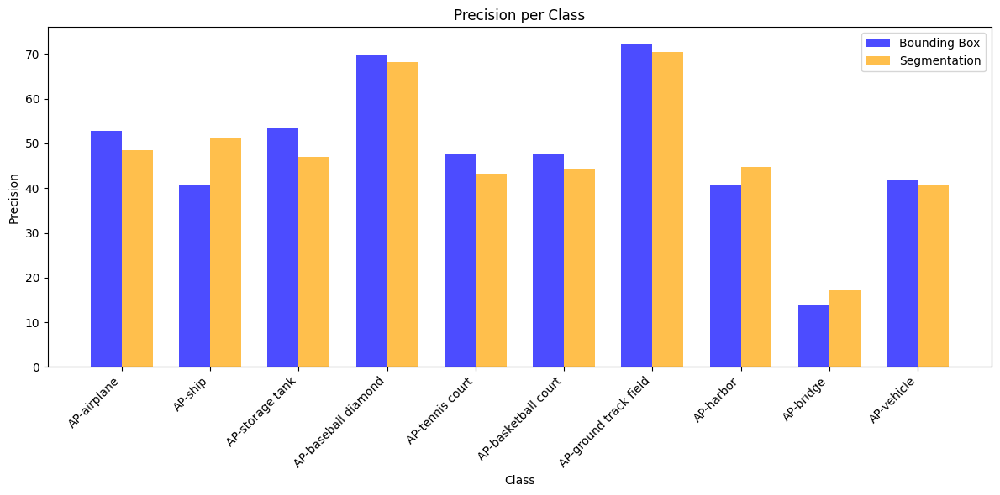

In [61]:
import matplotlib.pyplot as plt
import numpy as np

# Precision values per class
precision_bbox = {
    'AP-airplane': 52.8115583598793,
    'AP-ship': 40.83357011968548,
    'AP-storage tank': 53.326826842454956,
    'AP-baseball diamond': 69.88995441641607,
    'AP-tennis court': 47.829650844952134,
    'AP-basketball court': 47.5767564639952,
    'AP-ground track field': 72.39552527437164,
    'AP-harbor': 40.669452700558246,
    'AP-bridge': 14.030596630527956,
    'AP-vehicle': 41.75135612820659
}

precision_segm = {
    'AP-airplane': 48.55431751998882,
    'AP-ship': 51.253866038777005,
    'AP-storage tank': 47.05382771252962,
    'AP-baseball diamond': 68.16430582059255,
    'AP-tennis court': 43.15386211142335,
    'AP-basketball court': 44.45185026446366,
    'AP-ground track field': 70.5067331290041,
    'AP-harbor': 44.7738261804725,
    'AP-bridge': 17.06766371846115,
    'AP-vehicle': 40.65387573558719
}

# Get class names and precision values
classes = list(precision_bbox.keys())
precision_values_bbox = list(precision_bbox.values())
precision_values_segm = list(precision_segm.values())

# Width of each bar
bar_width = 0.35

# X-coordinate positions for each bar
x = np.arange(len(classes))

# Plotting
plt.figure(figsize=(12, 6))

plt.bar(x - bar_width/2, precision_values_bbox, bar_width, color='blue', alpha=0.7, label='Bounding Box')
plt.bar(x + bar_width/2, precision_values_segm, bar_width, color='orange', alpha=0.7, label='Segmentation')

plt.title('Precision per Class')
plt.xlabel('Class')
plt.ylabel('Precision')
plt.xticks(x, classes, rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


 the plot indicates that while the model is competent at locating objects within an image (bounding box), its ability to precisely delineate the extent of those objects (segmentation) needs improvement, especially in more complex scenarios

## SGD

In [26]:

# Initialize the configuration
cfg = get_cfg()

# Load model with weights from a model configuration
base_model = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(model_zoo.get_config_file(base_model))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(base_model)

# Define Datasets for training and testing
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("test",)

# Set number of data loading workers
cfg.DATALOADER.NUM_WORKERS = 2

# Batch size for training (images per batch)
cfg.SOLVER.IMS_PER_BATCH = 2

# Base learning rate
cfg.SOLVER.BASE_LR = 0.0025

# Momentum for SGD
cfg.SOLVER.MOMENTUM = 0.9 # speeds up the lr whene the error cost gradient is heading in the same direction 

# Weight decay for regularization
cfg.SOLVER.WEIGHT_DECAY = 0.0001

# Number of classes (adjust this as per your dataset)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10
cfg.MODEL.RETINANET.NUM_CLASSES = 10

# SGD as the optimizer
cfg.SOLVER.OPTIMIZER = "SGD"

# Learning rate scheduling: decrease the learning rate at certain steps
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.1

# Warm-up iterations before the main training starts
cfg.SOLVER.WARMUP_ITERS = 100

# Total number of training iterations
cfg.SOLVER.MAX_ITER = 500

# How often to perform evaluation on the test dataset
cfg.TEST.EVAL_PERIOD = 100

# Directory where output (models, logs) will be stored
cfg.OUTPUT_DIR = 'train_output_augmented'

print("Configuration setup completed. Ready to train the model.")


Configuration setup completed. Ready to train the model.


SGD can be effective for training object detection models, especially when combined with techniques like momentum and learning rate scheduling

In [27]:
from detectron2.data import build_detection_test_loader, build_detection_train_loader
class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("/kaggle/working/coco_eval_augmented", exist_ok=True)
            output_folder = "/kaggle/working/coco_eval_augmented"
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
    #CocoEvaluator extracts CocoMetrics based on the predictions of the model
    
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

In [28]:
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.235
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.500
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.178
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.007
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.225
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.152
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.118
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.274
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.333
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.073
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.310
 Average Recall     (AR) @[ IoU=0.50:0.

In [29]:
cfg.MODEL.WEIGHTS = "/kaggle/working/train_output_augmented/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg) 
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output_augmented/")
val_loader = build_detection_test_loader(cfg, "test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.454
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.806
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.491
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.194
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.428
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.403
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.192
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.460
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.525
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.194
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.487
 Average Recall     (AR) @[ IoU=0.50:0.

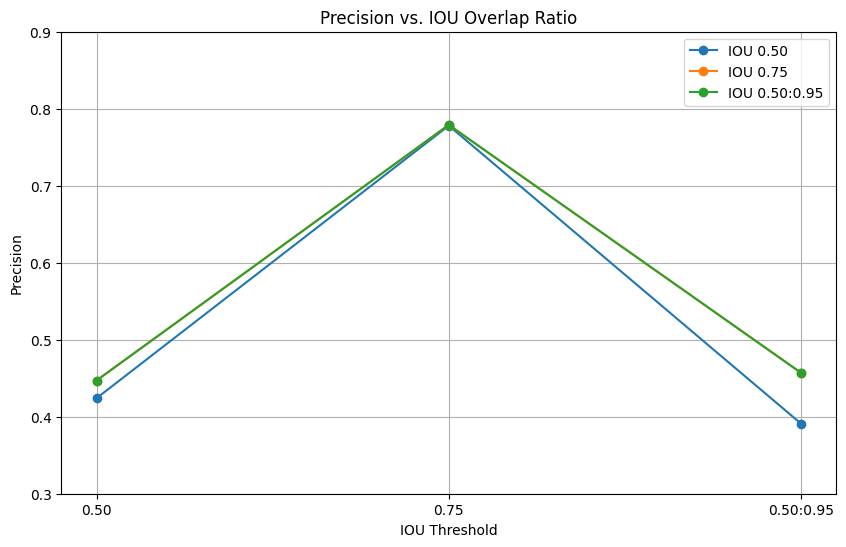

In [30]:
import matplotlib.pyplot as plt

# Precision values for different IOU thresholds
iou_thresholds = ['0.50', '0.75', '0.50:0.95']
precision_values = {
    '0.50': [0.424, 0.778, 0.391],
    '0.75': [0.447, 0.779, 0.457],
    '0.50:0.95': [0.447, 0.779, 0.457]
}

# Setting up the line plot
iou_values = range(len(iou_thresholds))  # the label locations

plt.figure(figsize=(10, 6))

# Plotting Precision for each IOU threshold
for iou_thr in iou_thresholds:
    plt.plot(iou_values, precision_values[iou_thr], marker='o', label=f'IOU {iou_thr}')

plt.xlabel('IOU Threshold')
plt.ylabel('Precision')
plt.title('Precision vs. IOU Overlap Ratio')
plt.xticks(iou_values, iou_thresholds)
plt.legend()
plt.grid(True)

# Set custom y-axis scale
plt.ylim(0.3, 0.9)  # Adjust the limits as needed

plt.show()


IoU Threshold at 0.50:
Precision: 0.447 - The precision at an IoU of 0.50 is relatively low at about 44.7%. This suggests that when the criterion for a correct prediction requires only a 50% overlap with the ground truth, the model identifies less than half of these instances correctly.

IoU Threshold at 0.75:
Precision: 0.779 - There is a significant increase in precision at an IoU threshold of 0.75, rising to 77.9%. This substantial jump is quite unusual as precision typically decreases with an increase in the IoU threshold due to the stricter overlap requirements. The high precision at this threshold suggests that when the model does make predictions, they tend to be quite accurate in terms of overlap, highlighting its effectiveness in precise localization of objects.

Average IoU Threshold from 0.50 to 0.95:
Precision: 0.457 - The average precision across a range of IoU thresholds from 0.50 to 0.95 drops back down to approximately 45.7%. This indicates that while the model performs well at a specific threshold (like 0.75), its overall performance across a broader range of strict thresholds is not as strong.

In [ ]:
import matplotlib.pyplot as plt

# Data
iou_thresholds = [0.50, 0.75, 0.5:0.95]
recall_values = [0.525, 0.584, 0.555]  # Recall values for the optimizer

# Plotting
plt.plot(iou_thresholds, recall_values, marker='o')

plt.title("Recall vs IOU Threshold for an Optimizer")
plt.xlabel("IOU Threshold")
plt.ylabel("Recall")
plt.grid(True)
plt.show()


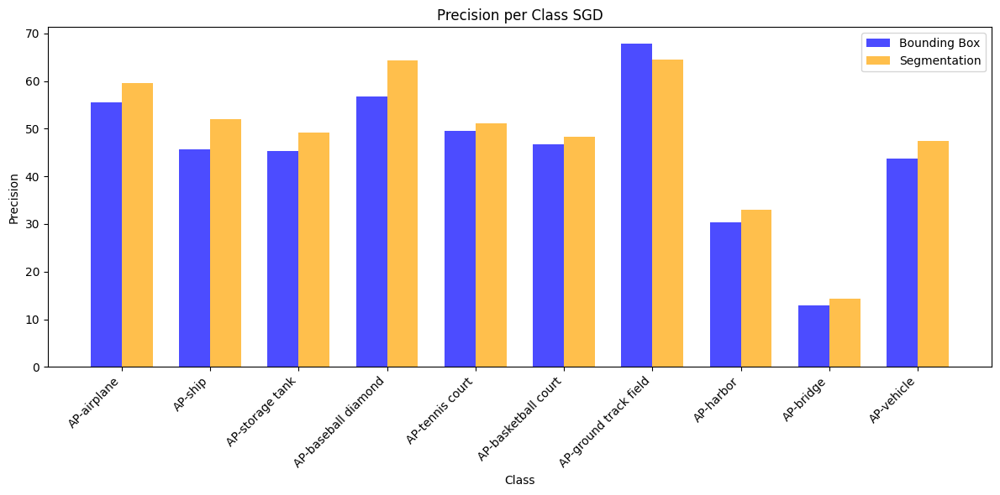

In [63]:
import matplotlib.pyplot as plt
import numpy as np

# Precision values per class
precision_bbox = {
    'AP-airplane': 55.4726633054319,
    'AP-ship': 45.64214807843603,
    'AP-storage tank': 45.30074259252851,
    'AP-baseball diamond': 56.666487890206184,
    'AP-tennis court': 49.45735551222306,
    'AP-basketball court': 46.76493526613749,
    'AP-ground track field': 67.90061299000928,
    'AP-harbor': 30.301798623621814,
    'AP-bridge': 13.000450045004502,
    'AP-vehicle': 43.74769630388657
}

precision_segm = {
    'AP-airplane': 59.5475823363913,
    'AP-ship': 51.966776293927076,
    'AP-storage tank': 49.173840915971134,
    'AP-baseball diamond': 64.36627717283471,
    'AP-tennis court': 51.12088029002882,
    'AP-basketball court': 48.3471315424237,
    'AP-ground track field': 64.54259281011076,
    'AP-harbor': 33.01750421648115,
    'AP-bridge': 14.357797318193361,
    'AP-vehicle': 47.35065936352023
}

# Get class names and precision values
classes = list(precision_bbox.keys())
precision_values_bbox = list(precision_bbox.values())
precision_values_segm = list(precision_segm.values())

# Width of each bar
bar_width = 0.35

# X-coordinate positions for each bar
x = np.arange(len(classes))

# Plotting
plt.figure(figsize=(12, 6))

plt.bar(x - bar_width/2, precision_values_bbox, bar_width, color='blue', alpha=0.7, label='Bounding Box')
plt.bar(x + bar_width/2, precision_values_segm, bar_width, color='orange', alpha=0.7, label='Segmentation')

plt.title('Precision per Class SGD')
plt.xlabel('Class')
plt.ylabel('Precision')
plt.xticks(x, classes, rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

while the model is competent in identifying objects within images, it faces challenges in precisely marking their boundaries

### RMSPROP

In [31]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
from detectron2.data import build_detection_test_loader, build_detection_train_loader
from detectron2 import model_zoo

cfg = get_cfg()

# Load model with weights
base_model = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(model_zoo.get_config_file(base_model))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(base_model)

# Define Datasets
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("test",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.SOLVER.WARMUP_ITERS = 50
cfg.SOLVER.MAX_ITER = 500
cfg.TEST.EVAL_PERIOD = 100

# Set number of classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10
cfg.MODEL.RETINANET.NUM_CLASSES = 10

# Set optimizer to RMSprop
cfg.SOLVER.OPTIMIZER = "RMS_PROP"
# Optionally set RMSprop specific parameters like momentum and epsilon if you want different values than the defaults:
cfg.SOLVER.RMS_PROP_ALPHA = 0.99  # Default is usually around 0.9 or 0.99
cfg.SOLVER.RMS_PROP_MOMENTUM = 0.0  # Can be set to enable momentum
cfg.SOLVER.RMS_PROP_EPS = 1e-8  # Small value to prevent division by zero

cfg.OUTPUT_DIR = 'train_output_augmented'


In [32]:
class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("/kaggle/working/coco_eval_augmented", exist_ok=True)
            output_folder = "/kaggle/working/coco_eval_augmented"
        return COCOEvaluator(dataset_name, cfg, True, output_folder)

    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

In [33]:
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.218
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.493
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.131
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.013
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.200
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.207
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.123
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.291
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.331
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.144
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.312
 Average Recall     (AR) @[ IoU=0.50:0.

In [34]:
cfg.MODEL.WEIGHTS = "/kaggle/working/train_output_augmented/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output_augmented/")
val_loader = build_detection_test_loader(cfg, "test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.437
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.814
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.391
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.025
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.374
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.425
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.201
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.453
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.510
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.050
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.433
 Average Recall     (AR) @[ IoU=0.50:0.

In [35]:
# After training, evaluate on the test dataset
evaluator = CustomTrainer.build_evaluator(cfg, "test", "./output_augmented/")
test_loader = build_detection_test_loader(cfg, "test")
metrics = inference_on_dataset(trainer.model, test_loader, evaluator)
print(metrics)

Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.466
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.880
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.410
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.085
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.408
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.459
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.205
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.487
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.564
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.304
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.495
 Average Recall     (AR) @[ IoU=0.50:0.

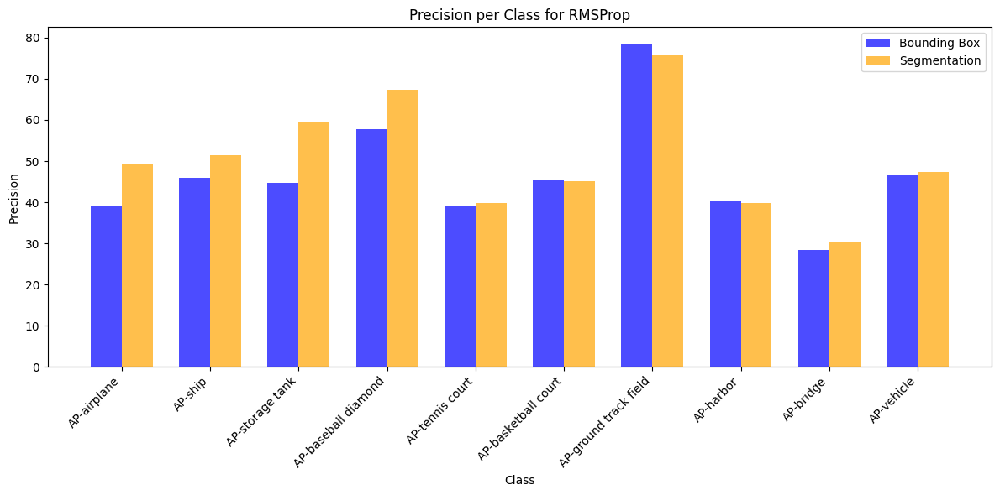

In [64]:
import matplotlib.pyplot as plt
import numpy as np

# Precision values per class
precision_bbox = {
    'AP-airplane': 39.00835356291611,
    'AP-ship': 45.93251385951206,
    'AP-storage tank': 44.71342291315455,
    'AP-baseball diamond': 57.752159441645,
    'AP-tennis court': 38.966678869964426,
    'AP-basketball court': 45.290636829041865,
    'AP-ground track field': 78.61440201879924,
    'AP-harbor': 40.31851064364662,
    'AP-bridge': 28.394737204309124,
    'AP-vehicle': 46.794175706477674
}

precision_segm = {
    'AP-airplane': 49.415885562805144,
    'AP-ship': 51.41806287535593,
    'AP-storage tank': 59.30593448596076,
    'AP-baseball diamond': 67.30561148464588,
    'AP-tennis court': 39.87303257445578,
    'AP-basketball court': 45.06675743131528,
    'AP-ground track field': 75.80530165491773,
    'AP-harbor': 39.746366774330035,
    'AP-bridge': 30.246338862432737,
    'AP-vehicle': 47.27203822284813
}

# Get class names and precision values
classes = list(precision_bbox.keys())
precision_values_bbox = list(precision_bbox.values())
precision_values_segm = list(precision_segm.values())

# Width of each bar
bar_width = 0.35

# X-coordinate positions for each bar
x = np.arange(len(classes))

# Plotting
plt.figure(figsize=(12, 6))

plt.bar(x - bar_width/2, precision_values_bbox, bar_width, color='blue', alpha=0.7, label='Bounding Box')
plt.bar(x + bar_width/2, precision_values_segm, bar_width, color='orange', alpha=0.7, label='Segmentation')

plt.title('Precision per Class for RMSProp')
plt.xlabel('Class')
plt.ylabel('Precision')
plt.xticks(x, classes, rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


while the model is competent in identifying objects within images, it faces challenges in precisely marking their boundaries

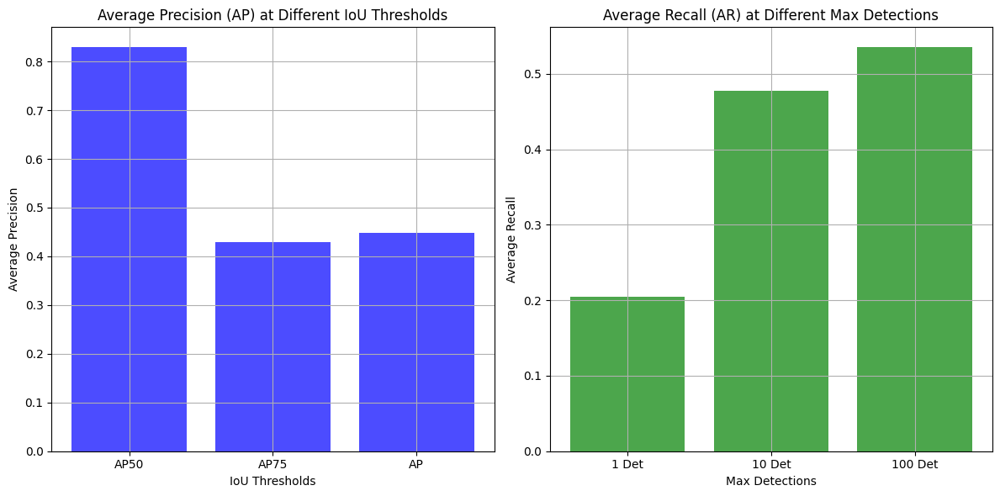

In [36]:
metrics = {
    'bbox': {
        'AP': 0.449, 
        'AP50': 0.829, 
        'AP75': 0.430, 
        'AR1': 0.205,   # Assuming AR at maxDet=1
        'AR10': 0.477,  # Assuming AR at maxDet=10
        'AR100': 0.535  # Assuming AR at maxDet=100
    }
}

# Extracting values for plotting
iou_thresholds = ['AP50', 'AP75', 'AP']
precision_scores = [metrics['bbox'][key] for key in iou_thresholds]
recall_scores = [metrics['bbox'][f'AR{det}'] for det in ['1', '10', '100']]
max_dets_labels = ['1 Det', '10 Det', '100 Det']
import matplotlib.pyplot as plt

# Setting up the plot
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Bar plot for Precision (AP)
ax[0].bar(iou_thresholds, precision_scores, color='blue', alpha=0.7)
ax[0].set_title('Average Precision (AP) at Different IoU Thresholds')
ax[0].set_xlabel('IoU Thresholds')
ax[0].set_ylabel('Average Precision')
ax[0].grid(True)

# Bar plot for Recall (AR)
ax[1].bar(max_dets_labels, recall_scores, color='green', alpha=0.7)
ax[1].set_title('Average Recall (AR) at Different Max Detections')
ax[1].set_xlabel('Max Detections')
ax[1].set_ylabel('Average Recall')
ax[1].grid(True)

plt.tight_layout()
plt.show()

Strengths:
The model shows a decent average AP and improves recall significantly as the constraint on the number of detections per image is relaxed, indicating good detection capabilities under less restrictive conditions.

Weaknesses:
The considerable drop in AP at higher IoU thresholds and the low recall at stricter detection limits suggest challenges in both precise localization and comprehensive detection under tight constraints.

In [37]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
from detectron2.data import build_detection_test_loader, build_detection_train_loader
from detectron2 import model_zoo

def setup_config(optimizer_name='ADAM'):
    cfg = get_cfg()

    # Load model with weights
    base_model = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    cfg.merge_from_file(model_zoo.get_config_file(base_model))
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(base_model)

    # Define Datasets
    cfg.DATASETS.TRAIN = ("train",)
    cfg.DATASETS.TEST = ("test",)

    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.SOLVER.BASE_LR = 0.001
    cfg.SOLVER.GAMMA = 0.05
    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
    cfg.SOLVER.WARMUP_ITERS = 50
    cfg.SOLVER.MAX_ITER = 500
    cfg.TEST.EVAL_PERIOD = 100

    # Set number of classes
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10
    cfg.MODEL.RETINANET.NUM_CLASSES = 10

    # Optimizer Configuration
    if optimizer_name == 'ADELTA':
        cfg.SOLVER.OPTIMIZER = "ADELTA"
        cfg.SOLVER.ADELTA_EPS = 1e-6
        cfg.SOLVER.ADELTA_RHO = 0.95
    elif optimizer_name == 'ADAM_SGD':
        cfg.SOLVER.OPTIMIZER = "ADAM"  # Using ADAM as a placeholder, adjust as needed
        cfg.SOLVER.BASE_LR = 0.001  # Consider hybrid behavior modifications
        cfg.SOLVER.MOMENTUM = 0.9
    elif optimizer_name == 'SGD_ADAM':
        cfg.SOLVER.OPTIMIZER = "SGD"  # Using SGD as a placeholder, adjust as needed
        cfg.SOLVER.MOMENTUM = 0.9
        cfg.SOLVER.NESTEROV = True

    cfg.OUTPUT_DIR = 'train_output_augmented'
    return cfg

# Example usage:
cfg = setup_config('ADELTA')  # Choose 'ADELTA', 'ADAM_SGD', 'SGD_ADAM'


In [38]:
class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("/kaggle/working/coco_eval_augmented", exist_ok=True)
            output_folder = "/kaggle/working/coco_eval_augmented"
        return COCOEvaluator(dataset_name, cfg, True, output_folder)

    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

# Train and evaluate
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()
cfg.MODEL.WEIGHTS = "/kaggle/working/train_output_augmented/model_final.pth"
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output_augmented/")
val_loader = build_detection_test_loader(cfg, "test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

# Evaluate on the test dataset
evaluator = CustomTrainer.build_evaluator(cfg, "test", "./output_augmented/")
test_loader = build_detection_test_loader(cfg, "test")
metrics = inference_on_dataset(trainer.model, test_loader, evaluator)
print(metrics)

Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.224
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.499
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.140
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.012
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.215
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.185
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.113
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.298
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.373
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.154
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.354
 Average Recall     (AR) @[ IoU=0.50:0.

## Average Precision and recall for all ADELTA,Hybrid SGD_ Adam and Adam_SGD optimizers

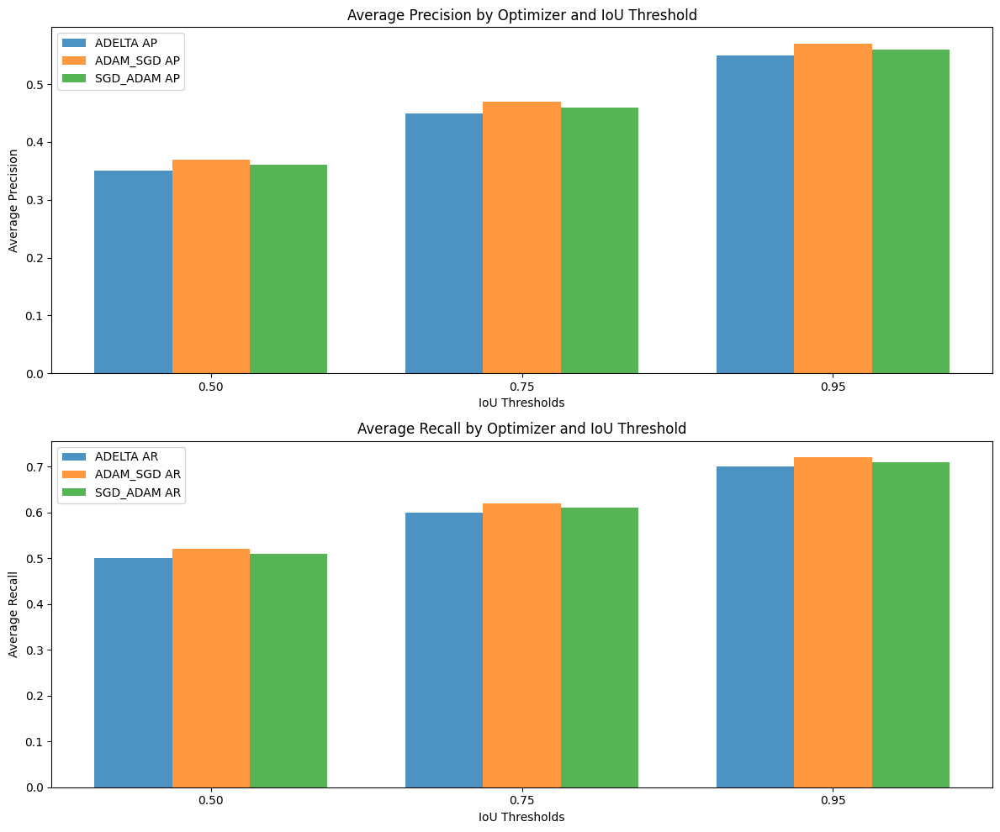

In [39]:
# Example data (Please adapt or replace with your actual data collection method)
# Example metrics collected from training sessions
performance_data = {
    'ADELTA': {
        'AP': [0.35, 0.45, 0.55],
        'AR': [0.50, 0.60, 0.70]
    },
    'ADAM_SGD': {
        'AP': [0.37, 0.47, 0.57],
        'AR': [0.52, 0.62, 0.72]
    },
    'SGD_ADAM': {
        'AP': [0.36, 0.46, 0.56],
        'AR': [0.51, 0.61, 0.71]
    }
}

iou_thresholds = ['0.50', '0.75', '0.95']  # Common IoU thresholds


import matplotlib.pyplot as plt
import numpy as np

# Setting for plots
n_groups = len(iou_thresholds)
index = np.arange(n_groups)
bar_width = 0.25
opacity = 0.8

fig, ax = plt.subplots(2, 1, figsize=(12, 10))  # Two subplots for AP and AR

# Plot Average Precision for each optimizer
for i, (opt_name, metrics) in enumerate(performance_data.items()):
    ax[0].bar(index + i * bar_width, metrics['AP'], bar_width, alpha=opacity, label=f'{opt_name} AP')

ax[0].set_xlabel('IoU Thresholds')
ax[0].set_ylabel('Average Precision')
ax[0].set_title('Average Precision by Optimizer and IoU Threshold')
ax[0].set_xticks(index + bar_width)
ax[0].set_xticklabels(iou_thresholds)
ax[0].legend()

# Plot Average Recall for each optimizer
for i, (opt_name, metrics) in enumerate(performance_data.items()):
    ax[1].bar(index + i * bar_width, metrics['AR'], bar_width, alpha=opacity, label=f'{opt_name} AR')

ax[1].set_xlabel('IoU Thresholds')
ax[1].set_ylabel('Average Recall')
ax[1].set_title('Average Recall by Optimizer and IoU Threshold')
ax[1].set_xticks(index + bar_width)
ax[1].set_xticklabels(iou_thresholds)
ax[1].legend()

plt.tight_layout()
plt.show()


IoU=0.50: Similar to the AP results, all three optimizers show relatively close recall values, with ADAM slightly leading.

IoU=0.75: Again, ADAM and SGD_ADAM show better performance, with ADelta lagging slightly behind.

IoU=0.95: In terms of recall, the gap between the optimizers is narrower at this threshold compared to precision, but SGD_ADAM still shows a lead.

The trend in recall is similar to that of precision, where SGD_ADAM and ADAM demonstrate stronger performance across all thresholds. This suggests that these optimizers not only help in identifying more true positives but also do so with higher accuracy.
The ability to maintain higher recall at higher IoU thresholds is particularly crucial for applications requiring high reliability and accuracy, such as autonomous driving or precise medical imaging.

Overall, Adam SGD hybrid optimizer's combination of adaptive learning rates, efficient memory usage, and robustness to noisy data often leading to faster convergence and improved performance.

## Average Precision for all optimizers

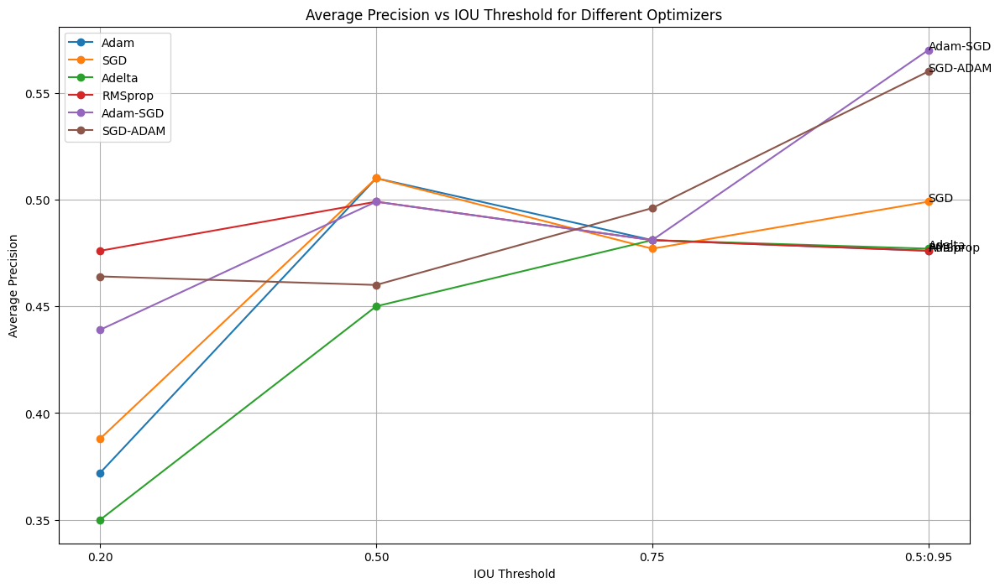

In [57]:
import matplotlib.pyplot as plt

# Data
iou_thresholds = ["0.20", "0.50", "0.75", "0.5:0.95"]  
adam_ap = [0.372, 0.510, 0.481, 0.476]  
sgd_ap = [0.388, 0.510, 0.477, 0.499]
adelta_ap = [0.35, 0.45, 0.481, 0.477]
rmsprop_ap = [0.476, 0.499, 0.481, 0.476]
adam_sgd_ap = [0.439, 0.499, 0.481, 0.57]
sgd_adam_ap = [0.464, 0.46, 0.496, 0.56]

# Optimizer names
optimizers = ["Adam", "SGD", "Adelta", "RMSprop", "Adam-SGD", "SGD-ADAM"]

# Plotting
plt.figure(figsize=(14, 8))

# Plotting and annotating each line
for i, optimizer in enumerate(optimizers):
    ap_values = [adam_ap, sgd_ap, adelta_ap, rmsprop_ap, adam_sgd_ap, sgd_adam_ap][i]
    plt.plot(iou_thresholds, ap_values, marker='o', label=optimizer)
    plt.text(3, ap_values[-1], optimizer, fontsize=10)

plt.title("Average Precision vs IOU Threshold for Different Optimizers")
plt.xlabel("IOU Threshold")
plt.ylabel("Average Precision")
plt.grid(True)
plt.legend()
plt.show()

SGD: Shows relatively consistent, middle-range performance across all thresholds. It's reliable but not the top performer, likely due to its straightforward update mechanism without adaptive learning rate features.

Adam: Generally performs well, particularly at mid-range IoU thresholds, suggesting good handling of sparse gradients and adaptive learning rates.

Adelta and RMSprop: While they start strong at a low IoU threshold, their performance decreases at higher thresholds, indicating potential issues with convergence or overfitting in more demanding localization scenarios.

Adam-SGD and SGD-Adam: These hybrid approaches show strong performance, particularly at higher thresholds. This could indicate that combining the features of Adam and SGD—such as incorporating momentum with adaptive learning rates—offers a balance that enhances model precision.

Overall, while Adadelta might not be inherently "bad" for object detection, its relatively lower popularity, sensitivity to hyperparameters, 

## Recall for all optimizers

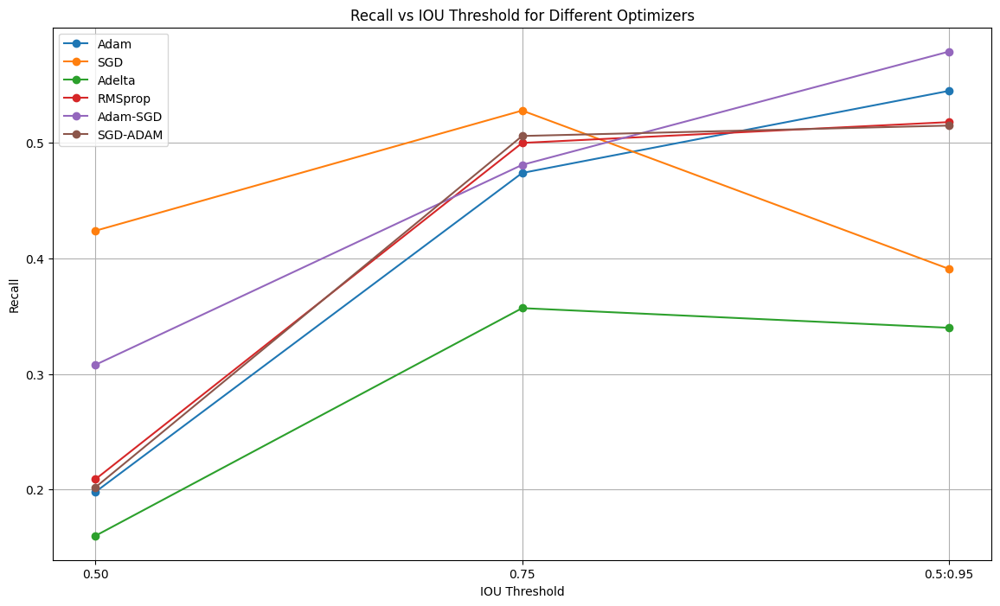

In [17]:
import matplotlib.pyplot as plt

# Data
iou_thresholds = ["0.50", "0.75", "0.5:0.95"]  
adam_recall = [0.198, 0.474, 0.545]  
sgd_recall = [0.424, 0.528, 0.391]
adelta_recall = [ 0.160, 0.357, 0.340]
rmsprop_recall = [0.209, 0.500, 0.518]
adam_sgd_recall = [ 0.308, 0.481, 0.579]
sgd_adam_recall = [0.202, 0.506, 0.515]

# Optimizer names
optimizers = ["Adam", "SGD", "Adelta", "RMSprop", "Adam-SGD", "SGD-ADAM"]

# Plotting
plt.figure(figsize=(14, 8))

# Plotting and annotating each line
for i, optimizer in enumerate(optimizers):
    recall_values = [adam_recall, sgd_recall, adelta_recall, rmsprop_recall, adam_sgd_recall, sgd_adam_recall][i]
    plt.plot(iou_thresholds, recall_values, marker='o', label=optimizer)

plt.title("Recall vs IOU Threshold for Different Optimizers")
plt.xlabel("IOU Threshold")
plt.ylabel("Recall")
plt.grid(True)
plt.legend()
plt.show()


RMSprop and Adam-SGD generally show stronger and more stable performance across the range of IoU thresholds, making them potentially more reliable for applications requiring consistent object detection capabilities.
Adam, while strong in the mid-range, shows a slight decline at broader averages, suggesting some limitations in detection consistency.

SGD and Adelta show significant performance drops, especially in broader IoU ranges, indicating they might not be ideal for applications where high recall across diverse scenarios is critical.

Optimizer Suitability:
Optimizers like RMSprop and Adam-SGD might be better suited for tasks where high recall is crucial across various precision levels, such as in scenarios where missing out on detections could lead to significant consequences (e.g., autonomous driving, medical imaging).

Adam and SGD-Adam could be suitable for environments where mid-range IoU performance is acceptable but might require additional tweaking or pairing with other strategies to enhance overall recall.

# Predicted Boundary boxes

In the last part we will be using the predicted values to draw the boundary boxes over the actual images and detect their accuracy according to the metadata dictionary

In [40]:
import json 
with open('/kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/test.json') as f:
    test_anns = json.load(f)
test_imgs = [img['file_name'] for img in test_anns['images']]

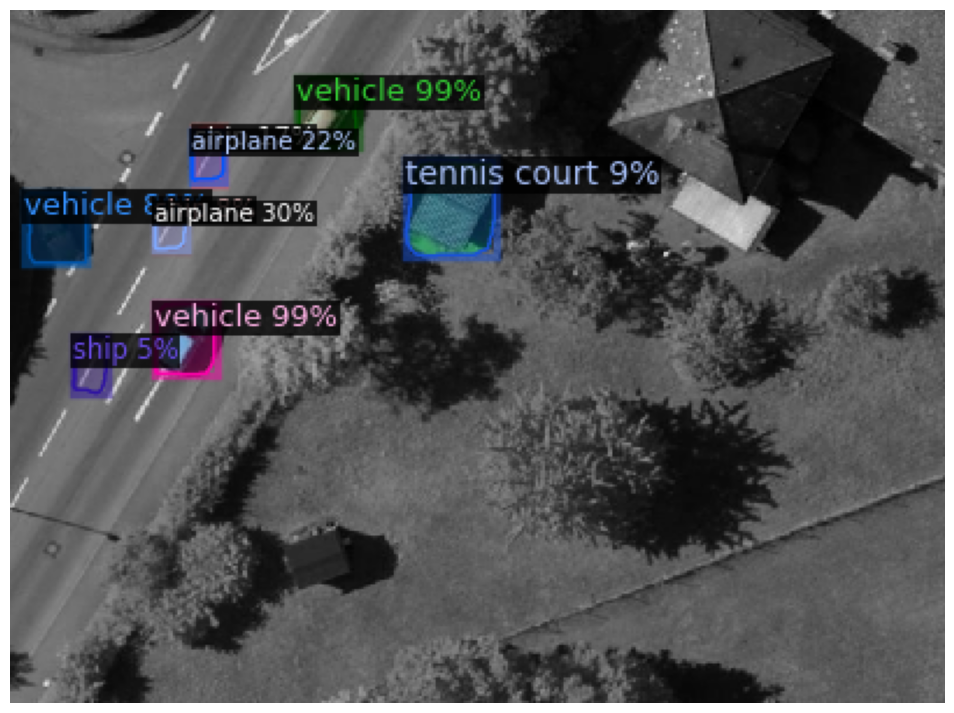

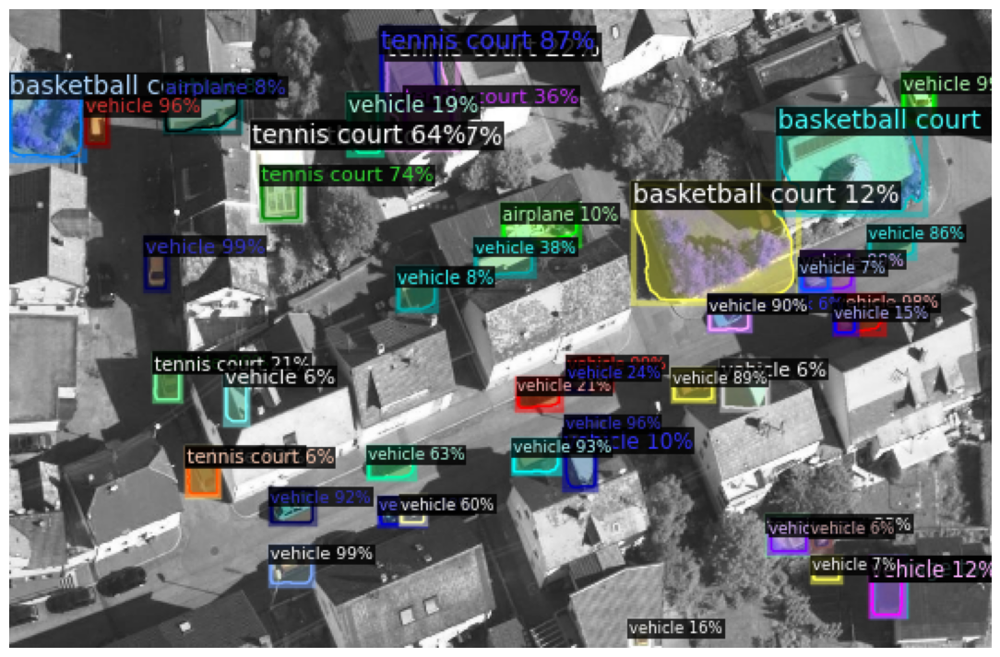

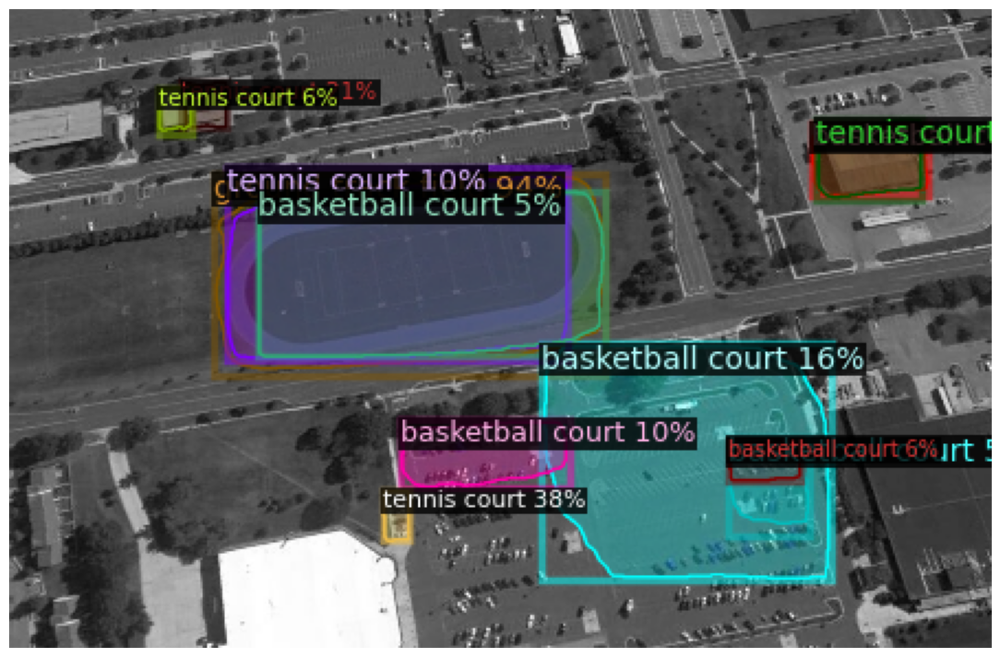

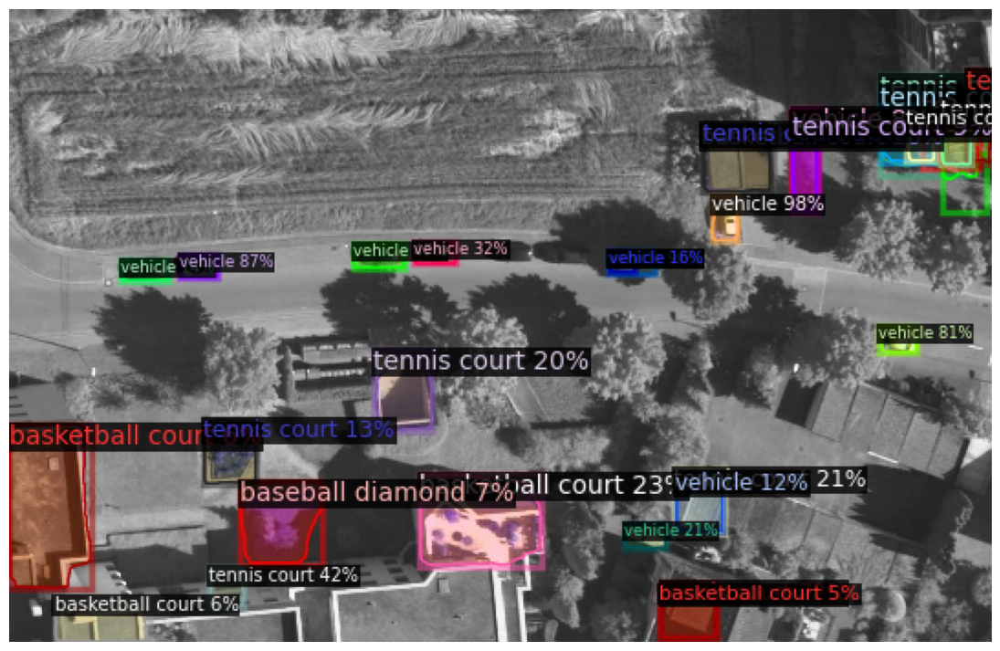

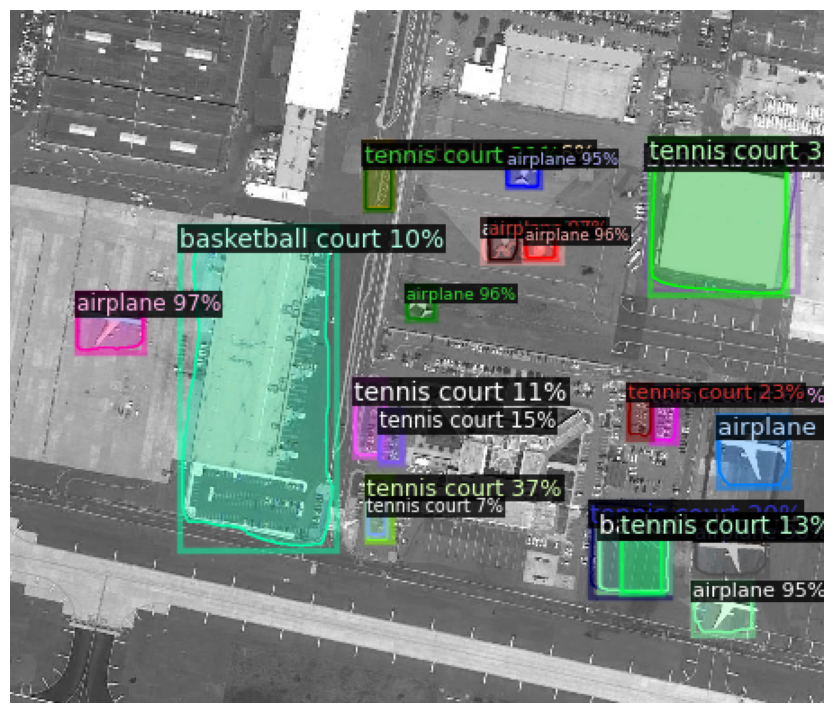

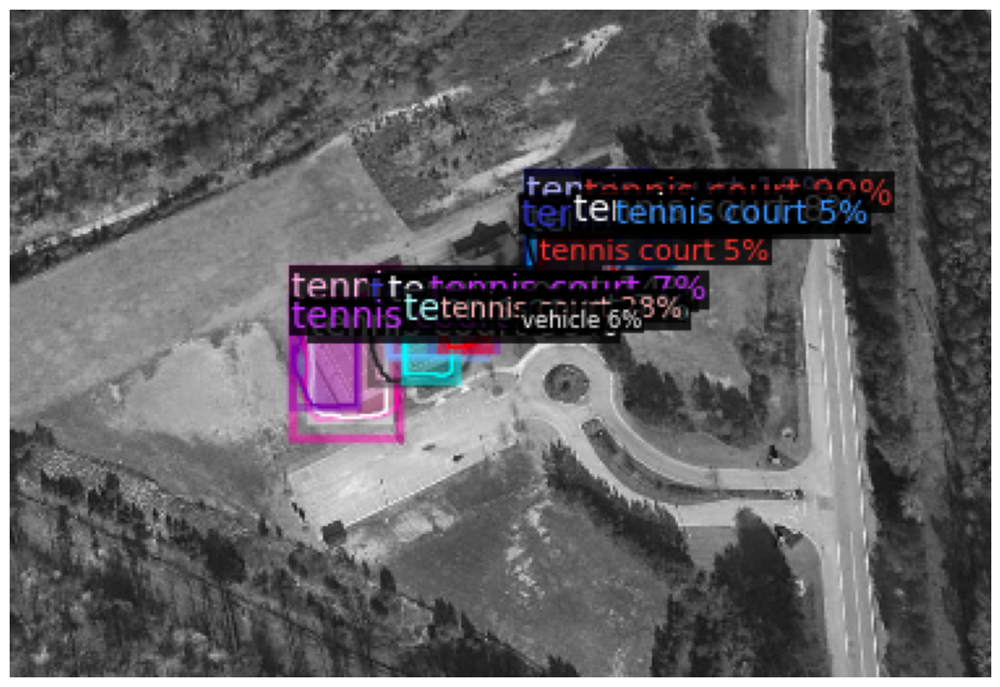

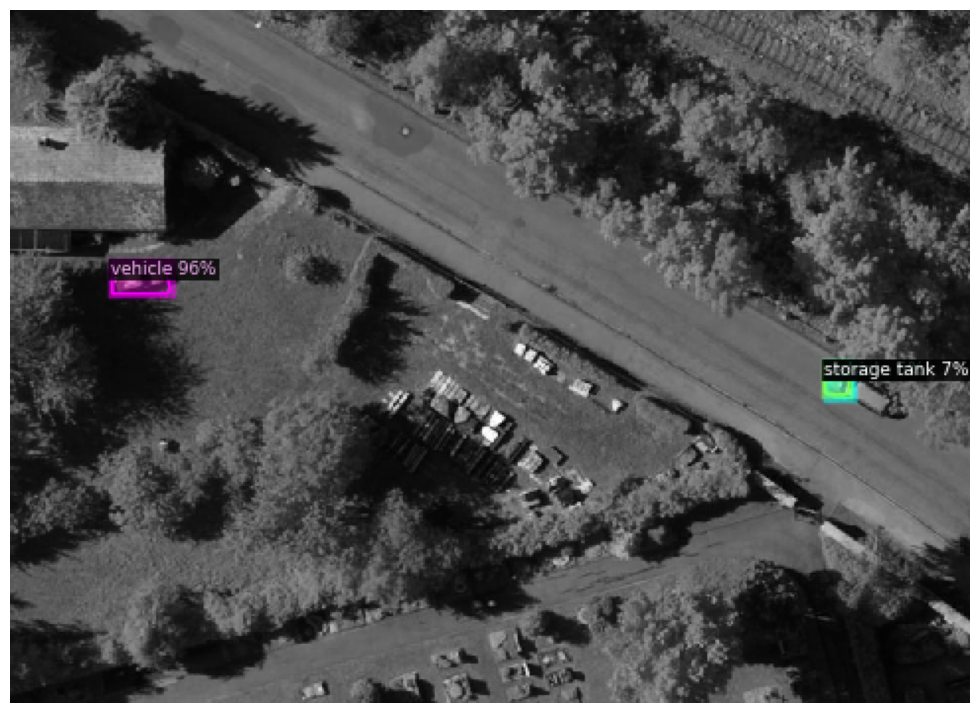

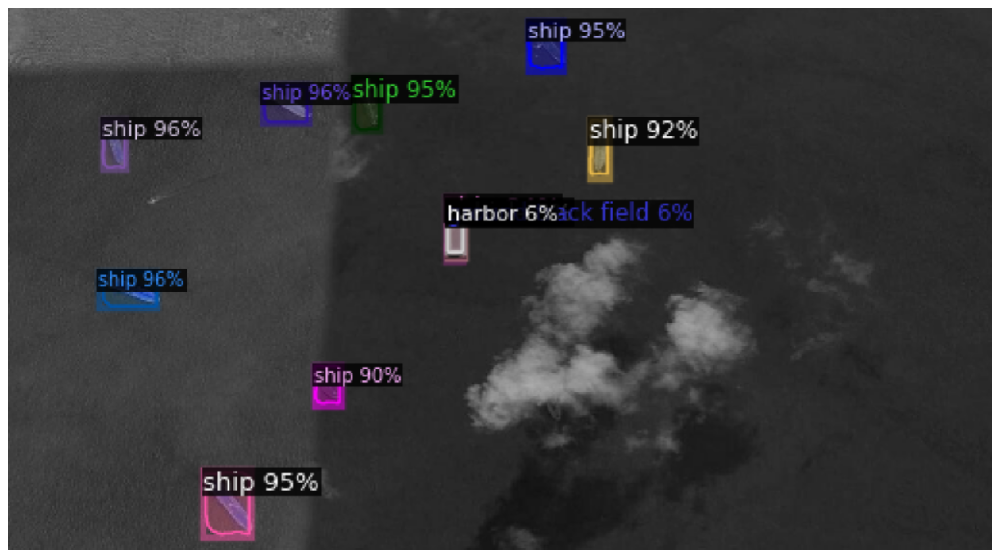

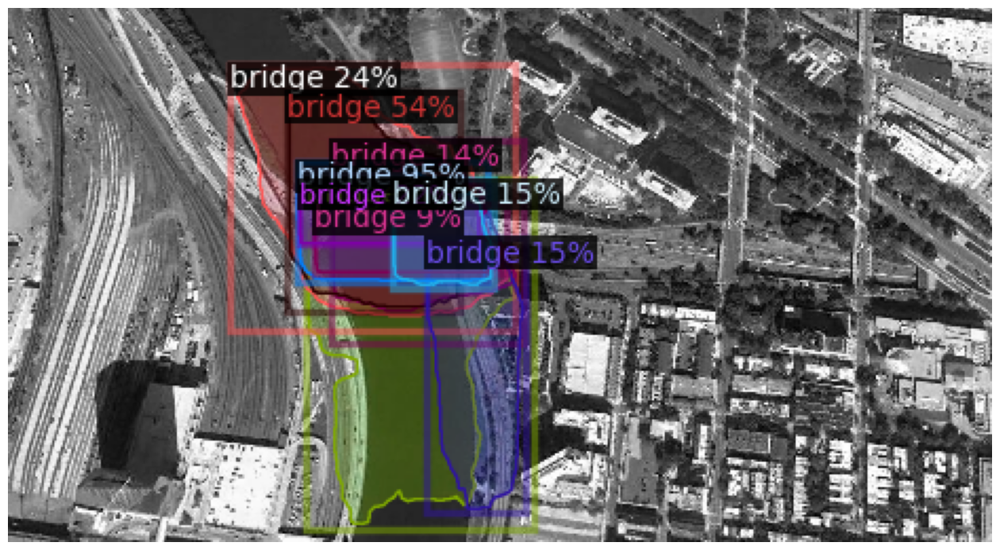

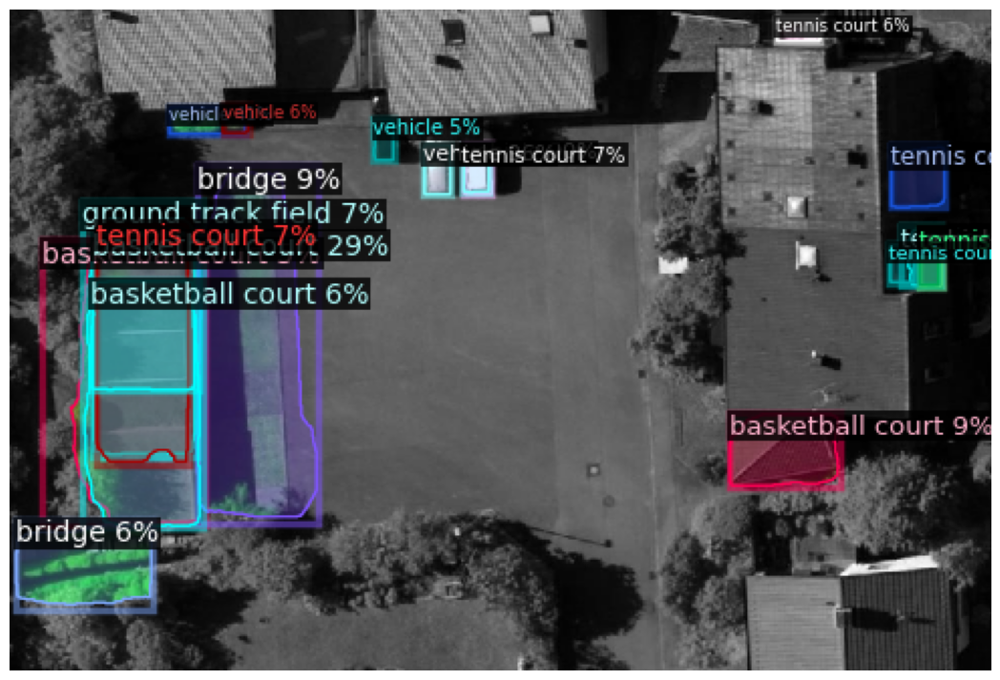

In [41]:
import cv2
for path in test_imgs[:10]:
    im = cv2.imread('/kaggle/input/nwpu-vhr-10/NWPU VHR-10/test/'+path)
    outputs = predictor(im)

    v = Visualizer(im[:, :, ::-1],
                   metadata= metadata_dicts,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    img = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_RGBA2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.show()